# Plotting Event Data with Python

It's been some time since I last posted a tutorial, let alone one in Python. So I thought now the time is better than ever to get back to it. In this tutorial I am going to run through plotting match events from StatsBomb using Python and Matplotlib. We are going to call the StatsBomb open data set using their Python package and then plot data from a few different scenarios. So let's get started.  

First we need to load the important libraries into Python.

In [1]:
# Read in libraries
import json
from statsbombpy import sb          # Used to obtain StatsBomb data. 
import statsbomb as sbp
import pandas as pd                 # Read and manipulate data.
import numpy as np                  # Read and manipulate data.
from pandas.io.json import json_normalize

import matplotlib.pyplot as plt     # Plotting data
from mplsoccer.pitch import Pitch

Now that we have the libraries, we can start to call the StatsBomb library for some data. We have a few options for this but first let's see what competitons we have available to us. From our free datasets, we have the following Female competitions to look at. 

In [2]:
comps = sb.competitions()
comps[comps.competition_gender == 'female']

credentials were not supplied. open data access only


,competition_id,season_id,country_name,competition_name,competition_gender,season_name,match_updated,match_available
15,37,42,England,FA Women's Super League,female,2019/2020,2020-08-12T11:24:04.483090,2020-08-12T11:24:04.483090
16,37,4,England,FA Women's Super League,female,2018/2019,2020-07-29T05:00,2020-07-29T05:00
32,49,3,United States of America,NWSL,female,2018,2020-07-29T05:00,2020-07-29T05:00
34,72,30,International,Women's World Cup,female,2019,2020-07-29T05:00,2020-07-29T05:00


So now we have this, let's find a single match to pull data from. 

In [3]:
matches = sb.matches(competition_id=37, season_id=42)
matches.head(5)

credentials were not supplied. open data access only


,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,last_updated,match_week,competition_stage,stadium,referee,data_version,shot_fidelity_version,xy_fidelity_version
0,2275054,2020-01-05,15:00:00.000,England - FA Women's Super League,2019/2020,Brighton & Hove Albion WFC,Liverpool WFC,1,0,available,2020-07-29T05:00,11,Regular Season,NaN,NaN,1.1.0,2,2
1,2275072,2020-01-05,13:30:00.000,England - FA Women's Super League,2019/2020,Chelsea FCW,Reading WFC,3,1,available,2020-07-29T05:00,11,Regular Season,The Cherry Red Records Stadium,S. Pearson,1.1.0,2,2
2,2275085,2020-01-05,15:00:00.000,England - FA Women's Super League,2019/2020,Tottenham Hotspur Women,Manchester City WFC,1,4,available,2020-07-29T05:00,11,Regular Season,The Hive Stadium,H. Conley,1.1.0,2,2
3,2275113,2020-01-19,16:00:00.000,England - FA Women's Super League,2019/2020,West Ham United LFC,Brighton & Hove Albion WFC,2,1,available,2020-07-29T05:00,13,Regular Season,The Rush Green Stadium,Ryan Atkin,1.1.0,2,2
4,19800,2019-03-14,20:30:00.000,England - FA Women's Super League,2019/2020,Arsenal WFC,Bristol City WFC,4,0,available,2020-08-12T11:24:04.483090,1,Regular Season,Meadow Park,R. Whitton,1.1.0,None,None


We can just use the first match on the list to pull all the events from. For this tutorial, we will pull the event data as a split dataset, split the data in to the events we want to look at. This will allow us to create a few different visuals for this match. 

### Shots

The first thing we will plot is shots from a single match. We have the match from above, so now we can pull the events from this match and split a specific type or event. First we will split the shots from our eventdata set to create a single shot plot. 

In [4]:
# Call the event API through the statsbomb package.
eventdata = sb.events(match_id=2275054, split=True)

# Split the shot events from the rest of the data.
shotevents = eventdata['shots']

# Split the location data in to x/y values.
# Location data is provided as a list which is harder to use. 
shotevents[['location_x', 'location_y']] = shotevents['location'].apply(pd.Series)

# Define columns we want to keep further down.
shotCols = ['statsbomb_xg', 'end_location_y', 'end_location_x', 'end_location_z']

# Create a function to split specific columns into values. 
# This function will split the end_location values specifically from 
# the shot column. 
def parse_function(data) -> pd.DataFrame:
    df = pd.DataFrame(data)
    dfcolumns = df.columns
    for i in dfcolumns:
        try:
            df[[str(i) + '_y', str(i) + '_x', str(i) + '_z']] = df[i].apply(pd.Series)
            df = df.drop(i, axis = 1)
        except ValueError:
            pass
    return df
# Run the data through the parse function and keep the columns above.
shot_df = parse_function(shotevents['shot'].apply(pd.Series))
shot_df = shot_df[shotCols]

# Merge the data together in to one dataframe.
shotevents['statsbomb_xg'], shotevents['end_location_x'], shotevents['end_location_y'], shotevents['end_location_z'] = shot_df['statsbomb_xg'], shot_df['end_location_y'], shot_df['end_location_x'], shot_df['end_location_z'] 
shotevents.head(5)

credentials were not supplied. open data access only


,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,...,shot,match_id,under_pressure,out,location_x,location_y,statsbomb_xg,end_location_x,end_location_y,end_location_z
0,3a4692e6-631c-47f4-8d34-644531797698,115,1,00:03:37.333,3,37,Shot,10,Liverpool WFC,From Goal Kick,...,"{'one_on_one': True, 'statsbomb_xg': 0.1886289...",2275054,NaN,NaN,108.9,52.3,0.188629,120.0,28.1,0.2
1,a49554c0-8b60-4eb0-9949-526cfcb6d54e,262,1,00:08:22.408,8,22,Shot,22,Brighton & Hove Albion WFC,From Throw In,...,"{'statsbomb_xg': 0.007219963, 'end_location': ...",2275054,NaN,NaN,86.5,56.2,0.007220,117.8,42.1,0.2
2,de542aa0-a50e-4318-b006-c4fe6cb23b41,642,1,00:18:49.169,18,49,Shot,48,Liverpool WFC,From Corner,...,"{'statsbomb_xg': 0.12033855, 'end_location': [...",2275054,NaN,NaN,115.7,39.1,0.120339,120.0,38.6,4.9
3,6f812987-8b59-42cc-b699-bc9337b6269a,705,1,00:20:56.064,20,56,Shot,52,Liverpool WFC,From Corner,...,"{'statsbomb_xg': 0.37038276, 'end_location': [...",2275054,NaN,NaN,113.3,45.4,0.370383,120.0,45.1,0.2
4,b4bd0579-da0a-46a0-9669-776989838113,870,1,00:27:55.377,27,55,Shot,60,Liverpool WFC,Regular Play,...,"{'statsbomb_xg': 0.011415341, 'end_location': ...",2275054,NaN,NaN,93.0,21.3,0.011415,120.0,45.0,4.5


With our dataset, we had a few steps to work through to get a clean dataframe. For example, our shot column is a dict, meaning we need to parse out these values before we can use them easily in our pitch plots below.

Now we have our values, we can create our shot plot using Matplotlib and mplsoccer libraries. 

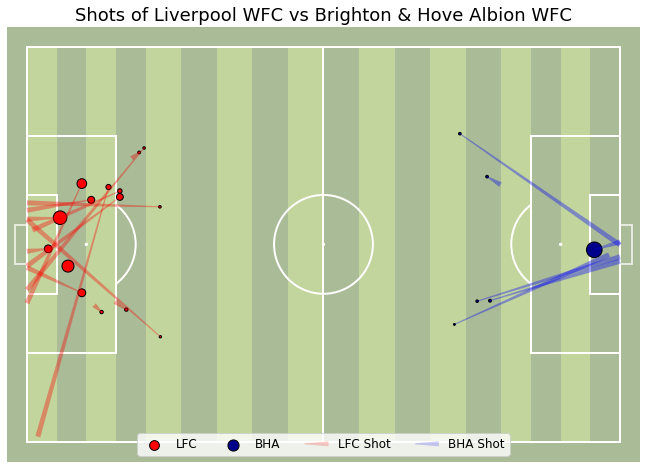

In [5]:
# Setup the pitch
figsize = (16, 8)
pitch = Pitch(figsize=figsize, tight_layout=False, goal_type='box', pitch_color='#aabb97', line_color='white', stripe_color='#c2d59d', stripe=True)
fig, ax = pitch.draw()

# Store team names
t1name = shotevents.team.iloc[0]
t2name = list(set(shotevents.team.unique()) - set([t1name]))[0]

# Split data by team
team1 = shotevents[shotevents.team == t1name] 
team1['location_x'] = 120 - team1['location_x']
team1['location_y'] = 80 - team1['location_y']
team1['end_location_x'] = 120 - team1['end_location_x']
team1['end_location_y'] = 80 - team1['end_location_y']
team2 = shotevents[shotevents.team == t2name]

# Plot starting locations 
t1 = pitch.scatter(team1.location_x, team1.location_y, s=team1.statsbomb_xg*500, ax=ax, color="red", edgecolors="k", label="LFC")
t2 = pitch.scatter(team2.location_x, team2.location_y, s=team2.statsbomb_xg*500, ax=ax, color="darkblue", edgecolors="k", label="BHA")

# Plot the shot directions 
lt1 = pitch.lines(team1.location_x, team1.location_y, team1.end_location_x, team1.end_location_y, ax=ax, alpha=0.2, color="red", comet=True, label="LFC Shot")
lt2 = pitch.lines(team2.location_x, team2.location_y, team2.end_location_x, team2.end_location_y, ax=ax, alpha=0.2, color="blue", comet=True, label="BHA Shot")

# Add a legend and a title to our plot
legend = ax.legend(loc='lower center', labelspacing=1, fontsize=12, ncol=4)
title = ax.set_title(f'Shots of {t1name} vs {t2name}', fontsize = 18)

There we have a nice lookng shot plot, with the lines for each shot and the size of the dot related to the xG for the shot taken. We can see this didn't take too much time and the mplsoccer library really made the pitch plot look great.

Using comet=True also adds a really nice looking line that adds to the image well. Let's give passes ago next using just the lines. 

## Passes

This time with our pass plot, we will do something slightly different and create a subplot to stack one team on top of the other. This will stop the plot looking crowded with both teams on the same figure. First we need to get our data, so let's do the same thing as with our shots. 

In [6]:
# Split the pass events from the rest of the data.
passevents = eventdata['passes']

# Split the location data in to x/y values.
# Location data is provided as a list which is harder to use. 
passevents[['location_x', 'location_y']] = passevents['location'].apply(pd.Series)

# Define columns we want to keep further down.
passCols = ['end_location_y', 'end_location_x', 'outcome_name']

# Create a function to split specific columns into values. 
# This function will split the end_location values specifically from 
# the shot column. 
def pass_parse_function(data) -> pd.DataFrame:
    df = pd.DataFrame(data)
    dfcolumns = df.columns
    for i in dfcolumns:
        try:
            df[[str(i) + '_x', str(i) + '_y']] = df[i].apply(pd.Series)
        except ValueError:
            pass

    return df
# Run the data through the parse function and keep the columns above.
pass_df = pass_parse_function(passevents['pass'].apply(pd.Series))
passoutcomes = pass_df['outcome'].apply(pd.Series)
pass_df = pass_df

# Merge the data together in to one dataframe.
passevents['end_location_x'], passevents['end_location_y'], passevents['outcome_name'] = pass_df['end_location_x'], pass_df['end_location_y'], passoutcomes['name']

passevents.head(5)

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,...,pass,match_id,under_pressure,off_camera,counterpress,location_x,location_y,end_location_x,end_location_y,outcome_name
0,cb8110ef-c586-479d-8aaf-52d991c1a6da,5,1,00:00:00.014,0,0,Pass,2,Brighton & Hove Albion WFC,From Kick Off,...,"{'recipient': {'id': 22337, 'name': 'Maya Le T...",2275054,NaN,NaN,NaN,61.0,40.1,37.0,42.3,NaN
1,2f58f14d-8cad-4d89-be9c-aa942e9acc32,8,1,00:00:02.664,0,2,Pass,2,Brighton & Hove Albion WFC,From Kick Off,...,"{'recipient': {'id': 16383, 'name': 'Danique K...",2275054,NaN,NaN,NaN,36.2,39.7,29.6,56.2,NaN
2,e3fc9388-b818-49b4-bded-0eb34194cfa6,12,1,00:00:06.966,0,6,Pass,2,Brighton & Hove Albion WFC,From Kick Off,...,"{'recipient': {'id': 22337, 'name': 'Maya Le T...",2275054,NaN,NaN,NaN,21.4,58.8,19.5,34.8,NaN
3,513cb3e7-e938-4a1a-a163-b598d7f8ed76,16,1,00:00:09.939,0,9,Pass,2,Brighton & Hove Albion WFC,From Kick Off,...,"{'recipient': {'id': 16400, 'name': 'Kayleigh ...",2275054,NaN,NaN,NaN,21.2,34.2,65.5,75.7,Incomplete
4,01634478-ec2a-4fa2-b9ec-5d9064a8e6b6,18,1,00:00:13.524,0,13,Pass,2,Brighton & Hove Albion WFC,From Kick Off,...,"{'recipient': {'id': 15631, 'name': 'Niamh Cha...",2275054,NaN,NaN,NaN,54.6,4.4,71.1,0.1,Out


Now we have our data, we can create our plot. This time, we are going to build our subplot as the axis and then add our pitch to each subplot. We also need to specify our figure size within the subplot creation so we don't get a small plot. Let's see how this turns out. 

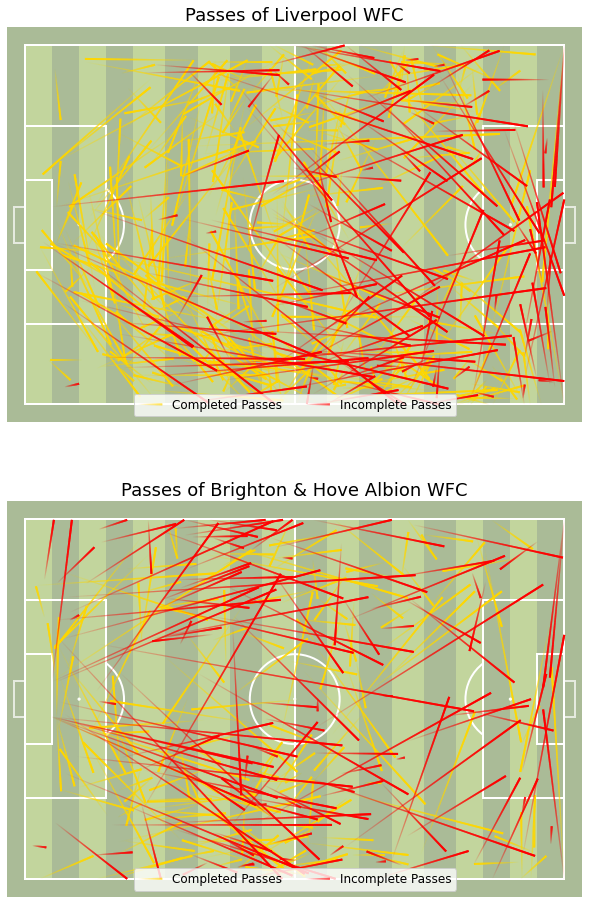

In [7]:
# Setup the pitch
figsize = (25, 16)
pitchpass = Pitch(figsize=figsize, goal_type='box', pitch_color='#aabb97', line_color='white', stripe_color='#c2d59d', stripe=True)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=figsize)
pitch.draw(ax=ax[0])
pitch.draw(ax=ax[1])

# Split data by team
passteam1 = passevents[passevents.team == t1name] 
passteam2 = passevents[passevents.team == t2name]

# Create a boolean value to filter the data below for 
# complete and incomplete passes.
compass = passteam1.outcome_name.isna()
compass2 = passteam2.outcome_name.isna()

# Plot starting locations 
t1 = pitchpass.lines(passteam1[compass].location_x, passteam1[compass].location_y, passteam1[compass].end_location_x, passteam1[compass].end_location_y, ax=ax[0], color="gold", label="Completed Passes", comet=True, lw=2, transparent=True)
t1incom = pitchpass.lines(passteam1[~compass].location_x, passteam1[~compass].location_y, passteam1[~compass].end_location_x, passteam1[~compass].end_location_y, ax=ax[0], color="red", label="Incomplete Passes", comet=True, lw=2, transparent=True)

t2 = pitchpass.lines(passteam2[compass2].location_x, passteam2[compass2].location_y, passteam2[compass2].end_location_x, passteam2[compass2].end_location_y, ax=ax[1], color="gold", label="Completed Passes", comet=True, lw=2, transparent=True)
t2incom = pitchpass.lines(passteam2[~compass2].location_x, passteam2[~compass2].location_y, passteam2[~compass2].end_location_x, passteam2[~compass2].end_location_y, ax=ax[1], color="red", label="Incomplete Passes", comet=True, lw=2, transparent=True)

# Add a legend and a title to our plot
legend = ax[0].legend(loc='lower center', labelspacing=1, fontsize=12, ncol=4)
title = ax[0].set_title(f'Passes of {t1name}', fontsize = 18)
# Add a legend and a title to our plot
legend = ax[1].legend(loc='lower center', labelspacing=1, fontsize=12, ncol=4)
title = ax[1].set_title(f'Passes of {t2name}', fontsize = 18)

How good is this, with the comet line we can see the start and end of the pass. While with the colours we can see the complete and incomplete passes easily.

Coming from R, coding these plots feels like it takes a lot, but in reality it is very similar just missing the pipe feature. But overall, I have to say I really like how these turned out. 

Hope you all enjoyed this tutorial / walkthrough of creating plots using Matplotlib in Python. I had fun creating these and will be looking to use these more in the future.  